In [ ]:
import os
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


def rho_nfw(c, r, Om0=0.286):
    f = np.log(1 + c) - c / (1 + c)
    x = r * c
    return 99 * c**3 / (3 * f) / (x * (1 + x) ** 2) / Om0


def plot_density_profiles_mean(base_dir,
                               suites,
                               cvir,
                               out_dir,
                               mask_range=None):
    col = {
        "SymphonyLMC": sns.color_palette("colorblind")[4],
        "SymphonyMilkyWay": sns.color_palette("colorblind")[0],
        "SymphonyGroup": sns.color_palette("colorblind")[2],
        "SymphonyLCluster": sns.color_palette("colorblind")[1],
        "SymphonyCluster": sns.color_palette("colorblind")[3],
    }
    name = {
        "SymphonyLMC": "LMC",
        "SymphonyMilkyWay": "Milky Way",
        "SymphonyGroup": "Group",
        "SymphonyLCluster": "L-Cluster",
        "SymphonyCluster": "Cluster",
    }

    os.makedirs(out_dir, exist_ok=True)
    fig, ax = plt.subplots(figsize=(6, 5), dpi=600)

    for suite in suites:
        prof_dir = os.path.join(base_dir, "output", suite, "density_profiles")
        files = sorted(glob(os.path.join(prof_dir, "halo_*_profile.csv")))
        if not files:
            continue
        p = [pd.read_csv(f) for f in files]
        r = p[0]["r_scaled"].to_numpy()
        if mask_range is not None:
            mask = (r >= mask_range[0]) & (r <= mask_range[1])
            r = r[mask]
        rho_r2 = np.array(
            [(d["rho_scaled"].to_numpy()[mask] if mask_range else d["rho_scaled"].to_numpy()) * r**2 for d in p]
        )
        mean = rho_r2.mean(axis=0)
        std = rho_r2.std(axis=0)
        color = col[suite]
        ax.loglog(r, mean, lw=1, color=color, label=name[suite])
        ax.fill_between(r, mean - std, mean + std, color=color, alpha=0.25, lw=0)
        ax.loglog(r, rho__nfw(cvir[suite], r) * r**2, ls="--", lw=0.9, color=color)

    ax.set_xlabel(r"$r / R_{\mathrm{vir}}$")
    ax.set_ylabel(r"$(\rho / \rho_m)\,(r/R_{\mathrm{vir}})^2$")
    ax.set_xscale("log")
    ax.set_yscale("log")
    if mask_range is not None:
        ax.set_xlim(*mask_range)
    ax.set_ylim(1, 4e2)
    ax.grid(True, which="both", ls=":")
    ax.legend(loc="lower right", fontsize=9, frameon=True)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, "density_profiles.pdf"))
    plt.show()
    plt.close()


base_dir = "/Users/fengbocheng/Projects/Symphony-PPSD"
suites = ["SymphonyLMC", "SymphonyMilkyWay", "SymphonyGroup",
          "SymphonyLCluster", "SymphonyCluster"]
cvir = {
    "SymphonyLMC": 12.2,
    "SymphonyMilkyWay": 10.8,
    "SymphonyGroup": 9.0,
    "SymphonyLCluster": 5.0,
    "SymphonyCluster": 5.3,
}
out_dir = os.path.join(base_dir, "output", "panels")
plot_density_profiles_mean(base_dir, suites, cvir, out_dir, mask_range=(2e-3, 1))


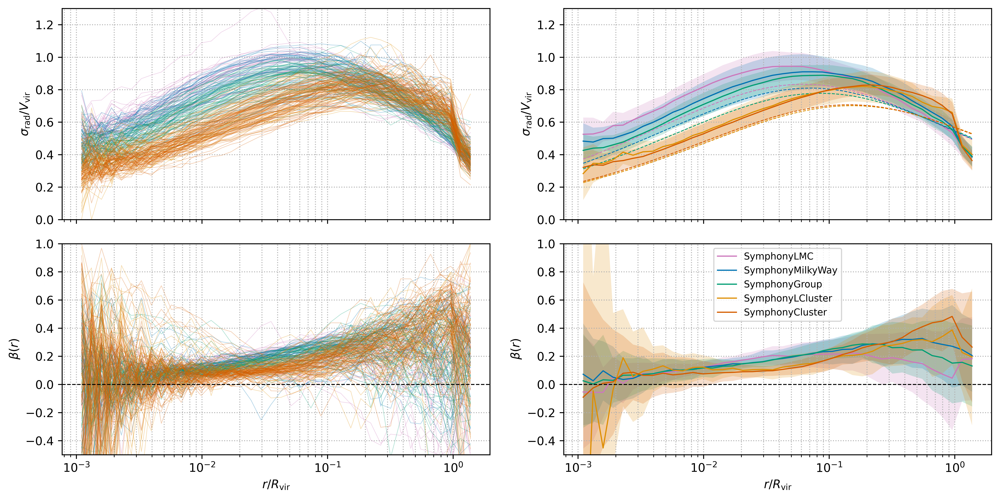

Saved to /Users/fengbocheng/Projects/Symphony-PPSD/output/panels/velocity_profiles_with_nfw.pdf


In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.integrate import quad

def nfw_velocity_profiles(c, x):
    g_c = 1 / (np.log(1 + c) - c / (1 + c))

    def integrand(t):
        g_t = np.log(1 + t) - t / (1 + t)
        return g_t / (t**3 * (1 + t)**2)

    integral, _ = quad(integrand, x, np.inf)
    sigma_r2_scaled = g_c * c * x * (1 + x)**2 * integral
    sigma_r = np.sqrt(sigma_r2_scaled)
    return sigma_r, np.sqrt(2) * sigma_r, np.sqrt(3) * sigma_r, 0.0

def plot_sigma_rad_and_beta_with_nfw(base_dir, suite_names, cvir_dict, output_dir):
    os.makedirs(output_dir, exist_ok=True)

    sim_colors = {
        'SymphonyLMC':      sns.color_palette("colorblind")[4],
        'SymphonyMilkyWay': sns.color_palette("colorblind")[0],
        'SymphonyGroup':    sns.color_palette("colorblind")[2],
        'SymphonyLCluster': sns.color_palette("colorblind")[1],
        'SymphonyCluster':  sns.color_palette("colorblind")[3]
    }

    fig, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True, dpi=600)
    titles = [r"$\sigma_{\mathrm{rad}} / V_{\mathrm{vir}}$", r"$\beta(r)$"]
    index_map = [0, 3]  # Only sigma_rad and beta

    all_data = {suite: [] for suite in suite_names}
    r = None

    for suite in suite_names:
        input_dir = os.path.join(base_dir, "output", suite, "velocity_profiles")
        files = sorted([f for f in os.listdir(input_dir) if f.endswith(".csv")])
        if not files:
            continue

        r = pd.read_csv(os.path.join(input_dir, files[0]))["r_scaled"].values
        sigma_rad = np.array([pd.read_csv(os.path.join(input_dir, f))["sigma_rad_scaled"].values for f in files])
        sigma_tan = np.array([pd.read_csv(os.path.join(input_dir, f))["sigma_tan_scaled"].values for f in files])
        sigma_tot = np.array([pd.read_csv(os.path.join(input_dir, f))["sigma_total_scaled"].values for f in files])
        beta_arr  = np.array([pd.read_csv(os.path.join(input_dir, f))["beta"].values for f in files])
        all_data[suite] = [sigma_rad, sigma_tan, sigma_tot, beta_arr]

    for plot_idx, data_idx in enumerate(index_map):
        if data_idx == 0:  # sigma_rad
            y_min, y_max = 0, 1.3
        elif data_idx == 3:  # beta
            y_min, y_max = -0.5, 1.0

        all_individual = []
        for suite in suite_names:
            profiles = all_data[suite][data_idx]
            color = sim_colors[suite]
            for arr in profiles:
                axes[plot_idx, 0].plot(r, arr, color=color, alpha=0.3, lw=0.5)
            all_individual.append(profiles)

        axes[plot_idx, 0].set_ylabel(titles[plot_idx])
        axes[plot_idx, 0].set_xscale("log")
        axes[plot_idx, 0].set_ylim(y_min, y_max)
        axes[plot_idx, 0].grid(True, which="both", ls=":")

        # mean ±1σ for each suite
        for suite in suite_names:
            profiles = all_data[suite][data_idx]
            color = sim_colors[suite]
            mean = np.nanmean(profiles, axis=0)
            std = np.nanstd(profiles, axis=0)
            axes[plot_idx, 1].plot(r, mean, color=color, lw=1, label=suite)
            axes[plot_idx, 1].fill_between(r, mean - std, mean + std, color=color, alpha=0.2, lw=0)

            if data_idx == 0:  
                sigma_r_nfw = np.array([nfw_velocity_profiles(cvir_dict[suite], ri * cvir_dict[suite])[data_idx] for ri in r])
                axes[plot_idx, 1].plot(r, sigma_r_nfw, ls="--", lw=0.7, color=color)

        axes[plot_idx, 1].set_ylabel(titles[plot_idx])
        axes[plot_idx, 1].set_xscale("log")
        axes[plot_idx, 1].set_ylim(y_min, y_max)
        axes[plot_idx, 1].grid(True, which="both", ls=":")
        
        if data_idx == 3:  
            axes[plot_idx, 0].axhline(0, color="black", ls="--", lw=0.8)
            axes[plot_idx, 1].axhline(0, color="black", ls="--", lw=0.8)

        if plot_idx == 1:
            axes[plot_idx, 1].legend(fontsize=8, loc="best", frameon=True)

    axes[1, 0].set_xlabel(r"$r / R_{\mathrm{vir}}$")
    axes[1, 1].set_xlabel(r"$r / R_{\mathrm{vir}}$")
    fig.tight_layout(rect=[0, 0, 1, 1])

    save_path = os.path.join(output_dir, "velocity_profiles_with_nfw.pdf")
    plt.savefig(save_path, format="pdf")
    plt.show()
    plt.close(fig)
    print(f"Saved to {save_path}")

base_dir = "/Users/fengbocheng/Projects/Symphony-PPSD"
suite_names = ["SymphonyLMC", "SymphonyMilkyWay", "SymphonyGroup", "SymphonyLCluster", "SymphonyCluster"]
mean_cvir_dict = {
    "SymphonyLMC": 12.2,
    "SymphonyMilkyWay": 10.8,
    "SymphonyGroup": 9.0,
    "SymphonyLCluster": 5.0,
    "SymphonyCluster": 5.3
}
output_dir = os.path.join(base_dir, "output", "panels")
plot_sigma_rad_and_beta_with_nfw(base_dir, suite_names, mean_cvir_dict, output_dir)


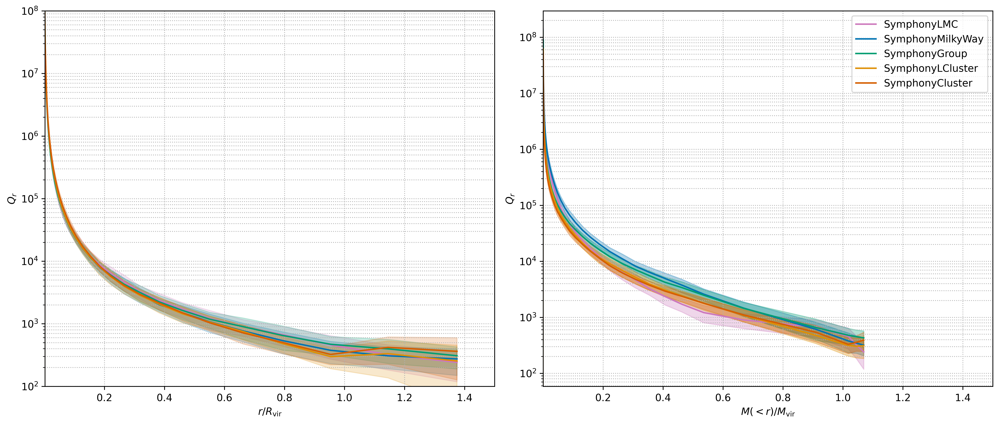

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_combined_ppsd_Qr(base_dir, suite_names, output_dir):
    os.makedirs(os.path.join(base_dir, "output", "Combined"), exist_ok=True)

    sim_colors = {
        'SymphonyLMC':      sns.color_palette("colorblind")[4],
        'SymphonyMilkyWay': sns.color_palette("colorblind")[0],
        'SymphonyGroup':    sns.color_palette("colorblind")[2],
        'SymphonyLCluster': sns.color_palette("colorblind")[1],
        'SymphonyCluster':  sns.color_palette("colorblind")[3]
    }

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=600)

    titles = [r"$Q_r$ vs $r/R_{\mathrm{vir}}$", r"$Q_r$ vs $M(<r)/M_{\mathrm{vir}}$"]

    all_data = {suite: [] for suite in suite_names}
    r = None
    m_all = None

    def interpolate_curves(x_target, x_list, y_list):
        return np.array([
            np.interp(x_target, x, y, left=np.nan, right=np.nan)
            for x, y in zip(x_list, y_list)
            if np.all(np.isfinite(x)) and np.all(np.isfinite(y))
        ])

    for suite in suite_names:
        input_dir = os.path.join(base_dir, "output", suite, "ppsd_profiles")
        files = sorted([f for f in os.listdir(input_dir) if f.endswith(".csv")])
        if not files:
            continue

        r = pd.read_csv(os.path.join(input_dir, files[0]))["r_scaled"].values
        m = pd.read_csv(os.path.join(input_dir, files[0]))["m_scaled"].values
        Qr = np.array([pd.read_csv(os.path.join(input_dir, f))["Q_r"].values for f in files])
        Qtot = np.array([pd.read_csv(os.path.join(input_dir, f))["Q_tot"].values for f in files])
        all_data[suite] = [Qr, Qtot, r, m]

        # Collect r and m to perform interpolation later
        if m_all is None:
            m_all = m
        r_list = [r] * len(files)  # align r arrays for interpolation

        # Interpolate Qr to match the m range
        Qr_interp_m = interpolate_curves(m_all, [m] * len(files), Qr)

        # Plot Qr vs r (mean + 1 sigma shaded)
        mean_Qr = np.nanmean(Qr, axis=0)
        std_Qr = np.nanstd(Qr, axis=0)
        axes[0].plot(r, mean_Qr, color=sim_colors[suite], lw=1.5, label=suite)
        axes[0].fill_between(r, mean_Qr - std_Qr, mean_Qr + std_Qr, color=sim_colors[suite], alpha=0.2)

        # Plot Qr vs M (mean + 1 sigma shaded)
        mean_Qr_m = np.nanmean(Qr_interp_m, axis=0)
        std_Qr_m = np.nanstd(Qr_interp_m, axis=0)
        axes[1].plot(m_all, mean_Qr_m, color=sim_colors[suite], lw=1.5, label=suite)
        axes[1].fill_between(m_all, mean_Qr_m - std_Qr_m, mean_Qr_m + std_Qr_m, color=sim_colors[suite], alpha=0.3)

    # Set axis labels and other settings
    axes[0].set_xlim(2e-3, 1.5)
    axes[0].set_ylim(1e2, 1e8)
    axes[0].set_xlabel(r"$r / R_{\mathrm{vir}}$")
    axes[0].set_ylabel(r"$Q_r$")
    axes[0].set_xscale("linear")
    axes[0].set_yscale("log")
    axes[0].grid(True, which="both", linestyle=":")

    axes[1].set_xlim(1e-4, 1.5)
    axes[1].set_xlabel(r"$M(<r) / M_{\mathrm{vir}}$")
    axes[1].set_ylabel(r"$Q_r$")
    axes[1].set_xscale("linear")
    axes[1].set_yscale("log")
    axes[1].grid(True, which="both", linestyle=":")
    axes[1].legend(fontsize=10, loc="best", frameon=True)

    fig.tight_layout(rect=[0, 0, 1, 1])

    save_path = os.path.join(output_dir, "ppsd_profiles.pdf")
    plt.savefig(save_path, format="pdf")
    plt.show()
    plt.close(fig)

base_dir = "/Users/fengbocheng/Projects/Symphony-PPSD"
suite_names = [
    "SymphonyLMC",
    "SymphonyMilkyWay",
    "SymphonyGroup",
    "SymphonyLCluster",
    "SymphonyCluster",
]
output_dir = os.path.join(base_dir, "output", "panels")
plot_combined_ppsd_Qr(base_dir, suite_names, output_dir)
